# Testing the neural network

In [2]:
%matplotlib inline
import sys
sys.path.append('../2_compare_detectors')
sys.path.append('../2_compare_detectors/bhtsne-master')
from image_scatter import *

import os
import numpy as np
import tensorflow as tf
import cv2
import pudb
import datetime
import time
import fnmatch
import random

import imgaug as ia
from imgaug import augmenters as iaa

import matplotlib.pyplot as plt
import matplotlib as mpl

from scipy import misc

**Load all the cached data**

In [39]:
hists_test = np.load("hists_test_kfold_0.npy")
labels_test = np.load("labels_test_kfold_0.npy")
hists_train = np.load("hists_train_kfold_0.npy")
hists_train = (hists_train / 255.) - 0.5
labels_train = np.load("labels_train_kfold_0.npy")

In [4]:
print len(labels_train)
print len(labels_test)
print hists_train[0:5]

21139
5746
[[[[ 0.04901961  0.07647059  0.10784314]
   [ 0.06470588  0.08823529  0.11176471]
   [ 0.09607843  0.11568627  0.13137255]
   ..., 
   [ 0.17058824  0.19803922  0.18235294]
   [ 0.14705882  0.18235294  0.17058824]
   [ 0.13921569  0.1745098   0.1627451 ]]

  [[ 0.04117647  0.06862745  0.10392157]
   [ 0.06862745  0.09607843  0.12352941]
   [ 0.08823529  0.10784314  0.12745098]
   ..., 
   [ 0.15490196  0.19411765  0.17058824]
   [ 0.13921569  0.1745098   0.1627451 ]
   [ 0.13529412  0.1745098   0.1627451 ]]

  [[ 0.03333333  0.06078431  0.1       ]
   [ 0.05686275  0.08823529  0.11960784]
   [ 0.07647059  0.1         0.12352941]
   ..., 
   [ 0.15490196  0.19411765  0.17058824]
   [ 0.13921569  0.17843137  0.16666667]
   [ 0.13921569  0.18235294  0.17058824]]

  ..., 
  [[-0.08431373 -0.06470588 -0.02941176]
   [-0.06078431 -0.05294118 -0.01764706]
   [-0.04901961 -0.0372549  -0.00980392]
   ..., 
   [ 0.1         0.14705882  0.15490196]
   [ 0.10392157  0.14705882  0.162745

**Design of the network**

Make placeholder values for all the variables (weights and biases)

In [5]:
# Design of network:
K = 36 # Conv layer, 3x3 patches, 1x1 stride
L = 72 # Conv layer, 3x3 patches, 2x2 stride
M = 144 # Conv layer, 3x3 patches, 2x2 stride
N = 288 # Conv layer, 3x3 layer, 2x2 stride 
O = 500 # Fully connected layer
P = 500 # Fully connected layer
# Softmax activation layer (n=2)

# We use Xavier-like weight initialization (2/number_of_inputs)
# http://andyljones.tumblr.com/post/110998971763/an-explanation-of-xavier-initialization
W1 = tf.Variable(tf.truncated_normal([3, 3, 3, K], stddev=2./(3*3*3)))
B1 = tf.Variable(tf.zeros([K]))
W2 = tf.Variable(tf.truncated_normal([3, 3, K, L], stddev=2./(3*3*3)))
B2 = tf.Variable(tf.zeros([L]))
W3 = tf.Variable(tf.truncated_normal([3, 3, L, M], stddev=2./(3*3*3)))
B3 = tf.Variable(tf.zeros([M]))
W4 = tf.Variable(tf.truncated_normal([3, 3, M, N], stddev=2./(3*3*3)))
B4 = tf.Variable(tf.zeros([N]))
W5 = tf.Variable(tf.truncated_normal([8 * 8 * N, O], stddev=2./(8*8*N)))
B5 = tf.Variable(tf.zeros([O]))
W6 = tf.Variable(tf.truncated_normal([O, P], stddev=2./O))
B6 = tf.Variable(tf.zeros([P]))
W7 = tf.Variable(tf.truncated_normal([P, 2], stddev=2./P))
B7 = tf.Variable(tf.zeros([2]))

# Input placeholder
X = tf.placeholder(tf.float32, [None, 64, 64, 3])

# Placeholder value for the ground truth label of the network
Y_ = tf.placeholder(tf.float32, [None, 2])

**Batch Normalization**

We will use batch normalization, define the function. We will use the moving average that was trained on the training set to normalize the test data

In [6]:
# test flag for batch norm
tst = tf.placeholder(tf.bool)
tst_conv = tf.placeholder(tf.bool)
iter = tf.placeholder(tf.int32)

# function from Martin Gorner (https://github.com/martin-gorner/tensorflow-mnist-
# tutorial/blob/master/mnist_4.2_batchnorm_convolutional.py#L53)
def batchnorm(Ylogits, is_test, iteration, offset, convolutional=False):
    exp_moving_avg = tf.train.ExponentialMovingAverage(0.999, iteration)
    # adding the iteration prevents from averaging across non-existing iterations
    bnepsilon = 1e-5
    if convolutional:
        mean, variance = tf.nn.moments(Ylogits, [0, 1, 2])
    else:
        mean, variance = tf.nn.moments(Ylogits, [0])
    update_moving_averages = exp_moving_avg.apply([mean, variance])
    m = tf.cond(is_test, lambda: exp_moving_avg.average(mean), lambda: mean)
    v = tf.cond(is_test, lambda: exp_moving_avg.average(variance), lambda: variance)
    Ybn = tf.nn.batch_normalization(Ylogits, m, v, offset, None, bnepsilon)
    return Ybn, update_moving_averages

**Putting all the calculation of the model together**

In [7]:
keep_prob = tf.placeholder(tf.float32)

Y1l = tf.nn.conv2d(X, W1, strides=[1, 1, 1, 1], padding='SAME')
Y1bn, _ = batchnorm(Y1l, tst_conv, iter, B1, convolutional=True)
Y1 = tf.nn.relu(Y1bn)

Y2l = tf.nn.conv2d(Y1, W2, strides=[1, 2, 2, 1], padding='SAME')
Y2bn, _ = batchnorm(Y2l, tst_conv, iter, B2, convolutional=True)
Y2 = tf.nn.relu(Y2bn)

Y3l = tf.nn.conv2d(Y2, W3, strides=[1, 2, 2, 1], padding='SAME')
Y3bn, _ = batchnorm(Y3l, tst_conv, iter, B3, convolutional=True)
Y3 = tf.nn.relu(Y3bn)

Y4l = tf.nn.conv2d(Y3, W4, strides=[1, 2, 2, 1], padding='SAME')
Y4bn, _ = batchnorm(Y4l, tst_conv, iter, B4, convolutional=True)
Y4 = tf.nn.relu(Y4bn)

YY = tf.reshape(Y4, shape=[-1, 8*8*N])

Y5l = tf.matmul(YY, W5)
Y5bn, _ = batchnorm(Y5l, tst, iter, B5)
Y5r = tf.nn.relu(Y5bn)
Y5 = tf.nn.dropout(Y5r, keep_prob)

Y6l = tf.matmul(Y5, W6)
Y6bn, _ = batchnorm(Y6l, tst, iter, B6)
Y6r = tf.nn.relu(Y6bn)
Y6 = tf.nn.dropout(Y6r, keep_prob)

Y = tf.nn.softmax(tf.matmul(Y6, W7) + B7)

**Define loss function**

We weight the loss function here, since we use the prediction of the image *not* showing cream here (second column) the weight multiplyer will value a false positive strongly. The loss function is currently not used in this notebook.

In [8]:
cross_entropy = tf.reduce_mean(
    tf.nn.weighted_cross_entropy_with_logits(
        targets=Y_[:,1], logits=Y[:,1], pos_weight=3))

# % of correct answers found in batch
is_correct = tf.equal(tf.argmax(Y, 1), tf.argmax(Y_, 1))
num_pos = tf.reduce_sum(tf.cast(tf.argmax(Y, 1), tf.float32))
accuracy = tf.reduce_mean(tf.cast(is_correct, tf.float32))

In [9]:
config = tf.ConfigProto(device_count = {'GPU': 1}) # Use the CPU for this notebook
init = tf.global_variables_initializer()
sess = tf.Session(config=config)
sess.run(init)

---
**Load pretrained model**

In [40]:
# Mean accuracy of epoch (840): 0.923295
# Mean entropy of epoch  (840): 0.886529
# Test sensitivity: 0.785534903136
# Test specifitity: 0.975720784139
# Test positive predictive value: 0.970223319043
# Test accuracy of epoch (840): 0.880292
# conv 12:27:18
model_name = "./ensemble_models/ensemble_1_best_ep_839.ckpt"

######################################################################################

# Test sensitivity: 0.803231386017
# Test specifitity: 0.973209683222
# Test positive predictive value: 0.930481277203
# Test accuracy: 0.920747994798
# model_name = "./models/ensemble_2_best_ep_801.ckpt"

######################################################################################

# Mean accuracy of epoch (857): 0.91712
# Mean entropy of epoch  (857): 0.877439
# Test sensitivity: 0.788508552637
# Test specifitity: 0.968791675197
# Test positive predictive value: 0.916844343164
# Test accuracy of epoch (857): 0.880765, really:0.914020425415
# model_name = "./models/ensemble_3_best_ep_856.ckpt"

######################################################################################

# Mean accuracy of epoch (819): 0.922554
# Mean entropy of epoch  (819): 0.88268
# Test sensitivity: 0.755528985323
# Test specifitity: 0.982273835629
# Test positive predictive value: 0.956127072949
# Test accuracy of epoch (819): 0.86994, really:0.905561171071
# Best model saved in file: ./models/ensemble_4_best_ep_818.ckpt

######################################################################################

# Mean accuracy of epoch (811): 0.921875
# Mean entropy of epoch  (811): 0.875217
# Test sensitivity: 0.710111042022
# Test specifitity: 0.982899625817
# Test positive predictive value: 0.946261674873
# Test accuracy of epoch (811): 0.847527, really:0.901670725893
# Model saved in file: ./models/ensemble_5_epoch_810.ckpt
# Best model saved in file: ./models/ensemble_5_best_ep_810.ckpt

saver = tf.train.Saver()
saver.restore(sess, model_name)

INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_1_best_ep_839.ckpt


In [41]:
# Run on the test in batches, the network is so large that there is not enough
# memory for all the test data at once
batch_size = 1000

number_of_runs = np.ceil(len(hists_test) / batch_size) + 1
test_accuracies = []
pred_labels = np.empty([0,2])
start = 0.

for i in range(number_of_runs.astype(int)):
    batch_begin = int(i*batch_size)
    batch_end = int(np.min((i*batch_size+batch_size, len(hists_test))))

    batch_X = hists_test[batch_begin:batch_end]
    batch_Y = labels_test[batch_begin:batch_end]

    test_pred, test_accuracy = \
        sess.run(
            [Y, accuracy],
            feed_dict={X: batch_X, Y_: batch_Y, keep_prob: 1.0, \
                tst: True, iter: start+i, tst_conv: True})
        
    pred_labels = np.concatenate((pred_labels, test_pred))

In [42]:
print pred_labels[0:10]

[[  7.90274858e-01   2.09725142e-01]
 [  9.99887228e-01   1.12765651e-04]
 [  7.57096410e-01   2.42903590e-01]
 [  1.71850428e-15   1.00000000e+00]
 [  0.00000000e+00   1.00000000e+00]
 [  1.00000000e+00   3.42899931e-09]
 [  1.00000000e+00   5.48115899e-08]
 [  9.99994397e-01   5.61939441e-06]
 [  9.99679327e-01   3.20705556e-04]
 [  2.86499835e-05   9.99971390e-01]]


---
**Calculate statistics**

In [43]:
pred_pos = (np.argmax(pred_labels, axis=1)==0)
pred_neg = (np.argmax(pred_labels, axis=1)==1)

truth_pos = (np.argmax(labels_test, axis=1)==0)
truth_neg = (np.argmax(labels_test, axis=1)==1)

true_pos = np.intersect1d(np.where(pred_pos), np.where(truth_pos))
true_neg = np.intersect1d(np.where(pred_neg), np.where(truth_neg))
false_pos = np.intersect1d(np.where(pred_pos), np.where(truth_neg))
false_neg = np.intersect1d(np.where(pred_neg), np.where(truth_pos))

sens = len(true_pos) / float(len(true_pos) + len(false_neg) + 0.00001)
spec = len(true_neg) / float(len(true_neg) + len(false_pos) + 0.00001)
ppv = len(true_pos) / float(len(true_pos) + len(false_pos) + 0.00001)
npv = len(true_neg) / float(len(true_neg) + len(false_neg) + 0.00001)

acc = (len(true_pos) + len(true_neg)) / float(len(labels_test) + 0.00001)

In [44]:
print "Number of false pos: " + str(len(false_pos))
print "Number of false neg: " + str(len(false_neg))

print "Test sensitivity: " + str(sens)
print "Test specifitity: " + str(spec)
print "Test positive predictive value: " + str(ppv)
print "Test accuracy: " + str(acc)

Number of false pos: 81
Number of false neg: 427
Test sensitivity: 0.785534903136
Test specifitity: 0.974711205199
Test positive predictive value: 0.95075987264
Test accuracy: 0.902194838463


**False positive images**

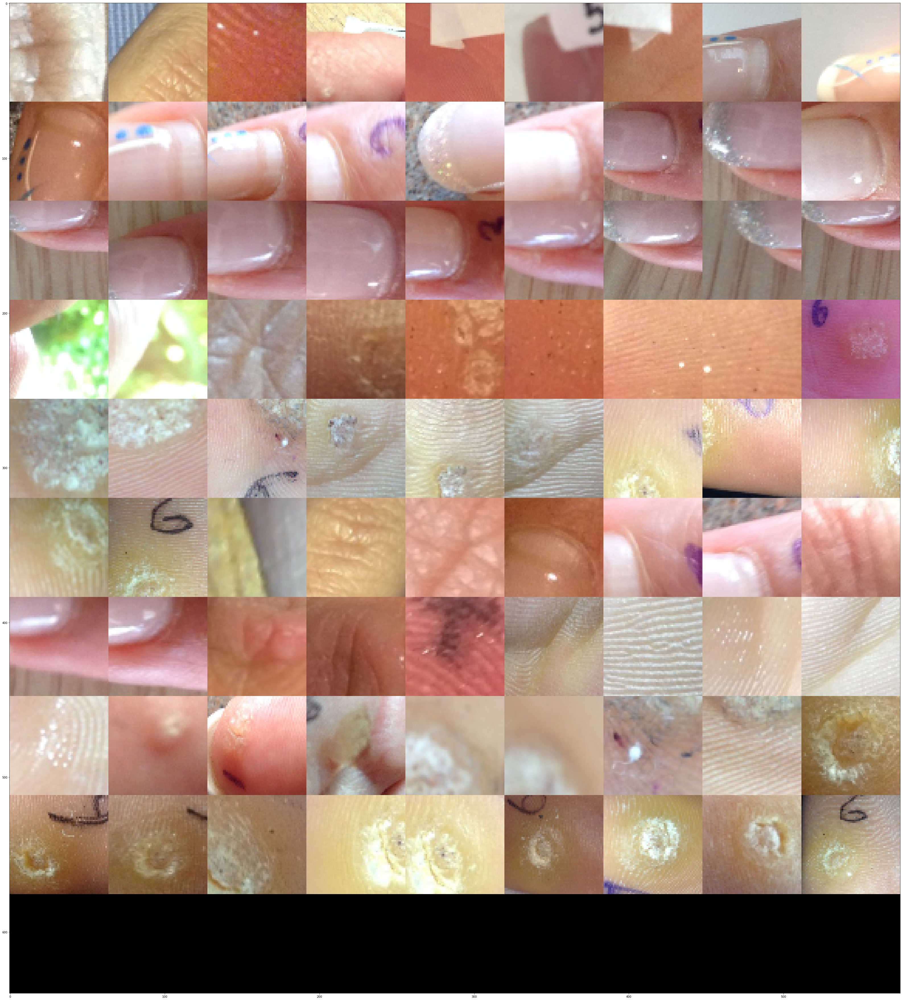

In [45]:
fig = plt.figure(figsize=(64, 64))  # width, height in inches
tstimages = (hists_test[false_pos] + 0.5) * 255.0
for i in range(len(false_pos)):
    tstimages[i] = cv2.cvtColor(tstimages[i].astype(np.float32), cv2.COLOR_BGR2RGB)
plt.imshow(ia.draw_grid(tstimages, cols=13, rows=10))

**False negative images**

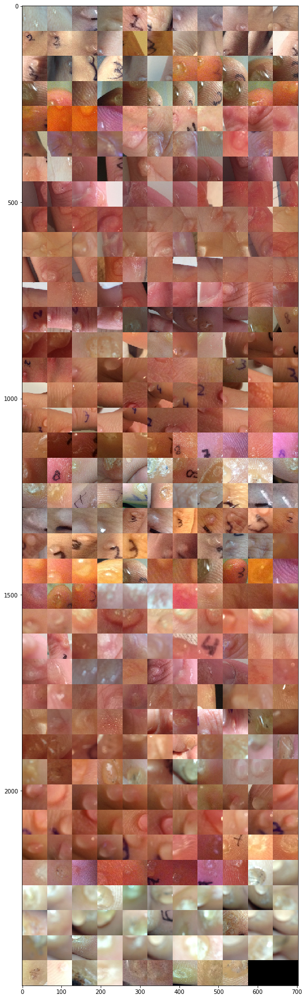

In [46]:
fig = plt.figure(figsize=(32, 32)) 
tstimages = (hists_test[false_neg] + 0.5) * 255.0
for i in range(len(false_neg)):
    tstimages[i] = cv2.cvtColor(tstimages[i].astype(np.float32), cv2.COLOR_BGR2RGB)
plt.imshow(ia.draw_grid(tstimages, cols=9, rows=39))

---
# Visualizing weights

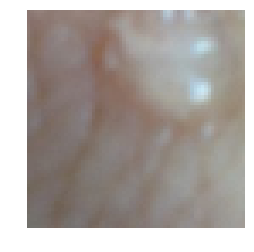

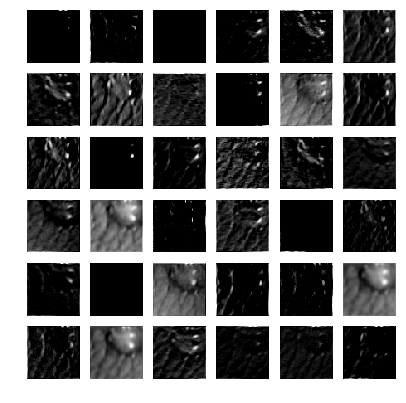

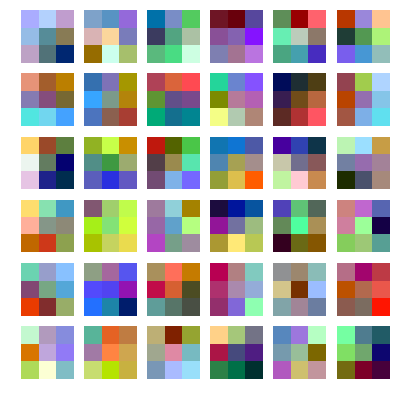

In [47]:
plt.figure()
index = true_pos[1]

weights, activations = sess.run([W1, Y1], feed_dict={X:hists_test[index:index+2], tst: True, tst_conv: True})

img = (hists_test[index]+0.5)*255
img = cv2.cvtColor(img.astype(np.float32), cv2.COLOR_BGR2RGB).astype(np.uint8)
plt.axis('off')
plt.imshow(img)

# activations
activations = activations[0]
_, sub = plt.subplots(6, 6, figsize=(64, 64))
plt.subplots_adjust(right = 0.23, left=0.15, top=0.18, bottom=0.1)
for i in range(6):
    for j in range(6):
        sub[i, j].axis('off')
        sub[i, j].imshow(activations[:,:,i*6 + j]*255, cmap='gray')
        
# weights
_, sub = plt.subplots(6, 6, figsize=(64, 64))
plt.subplots_adjust(right = 0.23, left=0.15, top=0.18, bottom=0.1)
for i in range(6):
    for j in range(6):
        sub[i, j].axis('off')
        w = weights[:,:,:,i*6 + j]
        w = (w - np.max(w))/-np.ptp(w)
        w = np.stack((w[:,:,2], w[:,:,1], w[:,:,0]), axis=-1)
        sub[i, j].imshow(w)

---
# Making heatmap of example image

Visualizing and Understanding Convolutional Networks
Matthew D. Zeiler and Rob Fergus, 2013
https://arxiv.org/abs/1311.2901

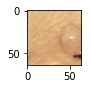

In [48]:
plt.figure(figsize=(1, 1)) 
pos_image_norm = hists_test[true_pos][5]
pos_image = (pos_image_norm + 0.5) * 255.
pos_image = cv2.cvtColor(pos_image.astype(np.float32), cv2.COLOR_BGR2RGB).astype(np.uint8)
plt.imshow(pos_image)

**Utility functions for making a heatmap**
- *block_regions_image*: Blocks off part of the images with a block of a certain size and defined stepsize.
- *heatmap_regions_image*: Makes a heatmap for the predictions generated by testing the blocked images.
- *generate_heatmap*: Combines the above two methods in one method

In [49]:
def block_regions_image(img, size, grayscale, step_size):
    images = []
    steps = np.ceil((img.shape[0] + size[0]) / float(step_size)).astype(int) + 1
    for y in range(steps):
        for x in range(steps):
            blocked_image = np.copy(img)
            if step_size*y <= 0 or step_size*x <= 0 or \
                step_size*y-size[0] >= img.shape[0] or \
                step_size*x-size[1] >= img.shape[1]: 
                continue
            blocked_image[np.max((0,step_size*y-size[0])):step_size*y, \
                          np.max((0,step_size*x-size[1])):step_size*x] = grayscale
            images.append(blocked_image)
    return images

def heatmap_regions_image(image_size, predictions, size, step_size):
    new_image = np.zeros(image_size[0:2])
    steps = np.ceil((image_size[0] + size[0]) / float(step_size)).astype(int) + 1
    i = 0
    for y in range(steps):
        for x in range(steps):
            if step_size*y <= 0 or step_size*x <= 0 or \
                step_size*y-size[0] >= image_size[0] or \
                step_size*x-size[1] >= image_size[1]: 
                    continue
            if predictions[i] > 0.5:
                new_image[np.max((0,step_size*y-size[0])):step_size*y, \
                          np.max((0,step_size*x-size[1])):step_size*x] += predictions[i]
            i += 1
    new_image[np.where(new_image) < 0] = 0
    if np.amax(new_image) == 0:
        # whole img is important
        new_image = np.ones(image_size[0:2])
    return new_image / np.amax(new_image)

def generate_heatmap(norm_img, size, step):
    blocked_imgs = block_regions_image(norm_img, size, -0.5, step)
    blocked_pred = sess.run([Y], feed_dict={X:blocked_imgs, keep_prob: 1, tst: True, tst_conv: True})[0]
    heatmap = heatmap_regions_image(norm_img.shape, blocked_pred[:,1], size, step)
    return heatmap

**Testing the blocking off method**

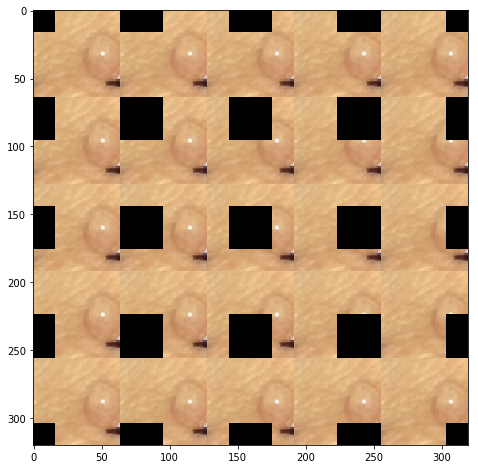

In [50]:
fig = plt.figure(figsize=(8, 8)) 
blocked_imgs_norm = block_regions_image(pos_image_norm, 
                                   size=(32,32), grayscale=-0.5, step_size=16)
blocked_imgs = (np.array(blocked_imgs_norm) + 0.5) * 255
for i in range(len(blocked_imgs)):
    blocked_imgs[i] = cv2.cvtColor(blocked_imgs[i].astype(np.float32), cv2.COLOR_BGR2RGB)
plt.imshow(ia.draw_grid(blocked_imgs[0:100], cols=5, rows=5))

Making predictions based on the blocked off images

In [51]:
blocked_pred = sess.run([Y], feed_dict={X:blocked_imgs_norm, keep_prob: 1, tst: True, tst_conv: True})[0]

This cell shows the blocked off images that were predicted as negative.

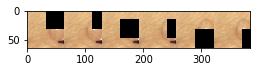

In [52]:
fig = plt.figure(figsize=(32, 32)) 

negs = np.array(blocked_imgs)[np.where(np.argmax(blocked_pred, axis = 1) == 1)]
if len(negs) > 0:
    fig = plt.figure(figsize=(4, 4))
    plt.imshow(ia.draw_grid(negs, cols=1, rows=1))

This function combines all of the above by providing it images it will generate blocked off versions and run the model on them. It will then create heatmaps and combine them with the original images

In [53]:
def make_heatmaps(images, contour=False):
    num_heatmaps = len(images)

    _, sub = plt.subplots(3, num_heatmaps, figsize=(64, 64))
    cmap = plt.get_cmap('hot')
    plt.subplots_adjust(right = 0.40, left=0.15, top=0.18, bottom=0.1)

    heatmaps = []
    for r in range(num_heatmaps):
        heatmap = generate_heatmap(images[r], size=(16,16), step=4)
        heatmaps.append(heatmap)
        heatmap = heatmaps[r]
        
        if contour:
            heatmap_thres = (heatmap > 0)
            edges = np.zeros(heatmap_thres.shape)
            _, contours, _ = cv2.findContours(heatmap_thres.astype(np.uint8), 
                                              cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            cv2.drawContours(edges, contours, -1, 1, thickness=2)
            
        heatmap_color = cmap(heatmap)
        heatmap_color = np.delete(heatmap_color, 3, 2)
        heatmap_color[np.where(heatmap_color==0)] = 0.5
        sub[1, r].axis('off')
        sub[1, r].imshow(heatmap_color)

        img_norm = images[r]
        img = (img_norm + 0.5) * 255.
        img = cv2.cvtColor(img.astype(np.float32), cv2.COLOR_BGR2RGB).astype(np.uint8)
        sub[0, r].axis('off')
        sub[0, r].imshow(img)
        
        sub[2, r].axis('off')
        if contour:
            img[np.where(edges == 1)] = img.astype(np.float32)[np.where(edges == 1)] * 0.65
            sub[2, r].imshow(img)
        else:
            img_heat = (img * heatmap_color).astype(np.uint8)
            sub[2, r].imshow(img_heat)
            
def img_heatmap(image, size=(16,16), step=4, color=0.2):
    heatmap = generate_heatmap(image, size, step)
    heatmap_thres = (heatmap > 0)
    edges = np.zeros(heatmap_thres.shape)
    _, contours, _ = cv2.findContours(heatmap_thres.astype(np.uint8), 
                                      cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cv2.drawContours(edges, contours, -1, 1, thickness=2)
    img_new = (image + 0.5) * 255.
    img_new = cv2.cvtColor(img_new.astype(np.float32), cv2.COLOR_BGR2RGB).astype(np.uint8)
    img_new[np.where(edges == 1)] = img_new.astype(np.float32)[np.where(edges == 1)] * color
    return img_new

---
**Resulting heatmaps**

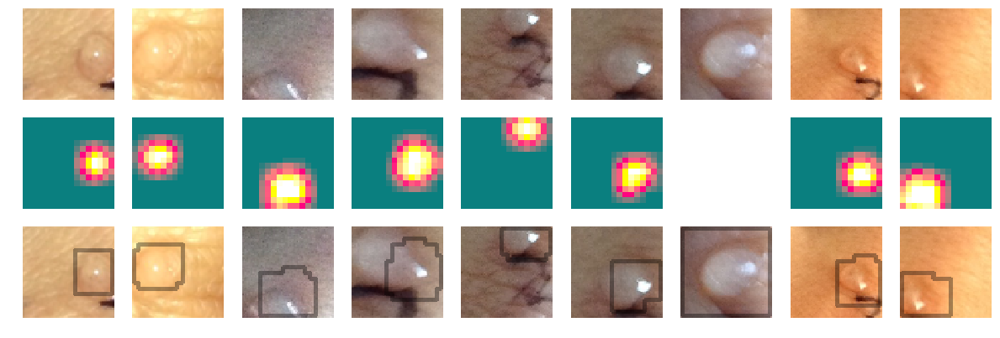

In [54]:
make_heatmaps(hists_test[true_pos][5:14], contour=True)

**False positives**

Heatmap shows parts of the images that can be blocked for the prediction to go to negative instead of positive.

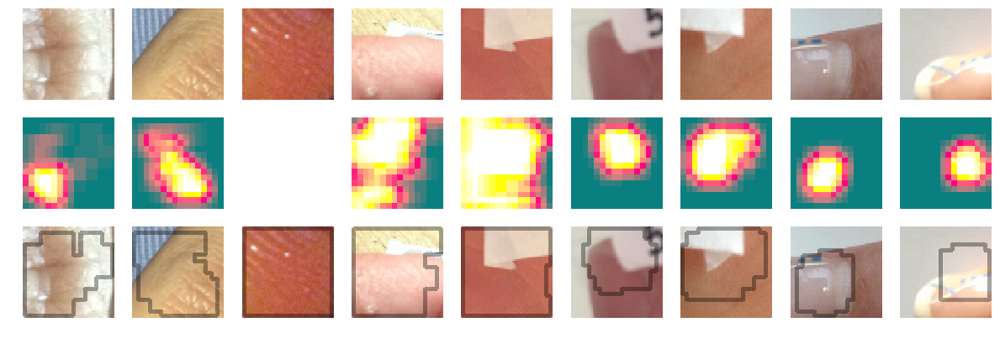

In [55]:
make_heatmaps(hists_test[false_pos][0:9], contour=True)

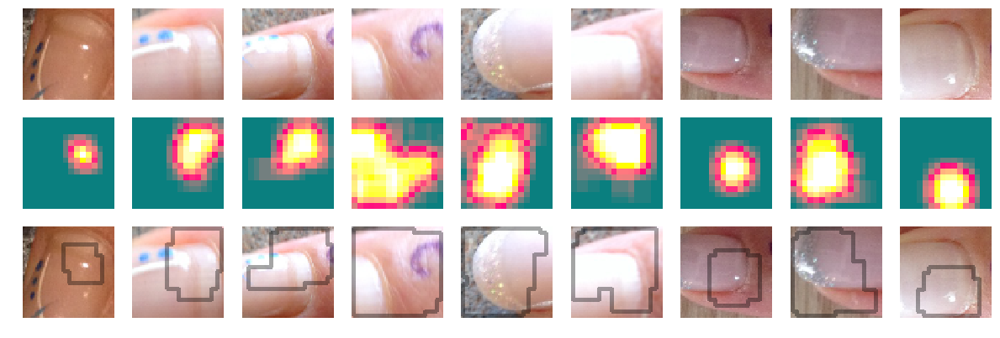

In [56]:
make_heatmaps(hists_test[false_pos][9:18], contour=True)

---
# T-sne

We are gonna run the whole dataset in the network and gather the activations of the activations of the last fully connected layer.

In [4]:
hists_test = np.load("hists_test_kfold_0.npy")
labels_test = np.load("labels_test_kfold_0.npy")
hists_train = np.load("hists_train_kfold_0.npy")
hists_train = (hists_train / 255.) - 0.5
labels_train = np.load("labels_train_kfold_0.npy")

In [5]:
all_data_imgs = np.concatenate((hists_train, hists_test))
all_data_labels = np.concatenate((labels_train, labels_test))

In [ ]:
# Run on the test in batches, the network is so large that there is not enough
# memory for all the test data at once
batch_size = 32

activations_all_data = []
pred_labels_all_data = []
number_of_runs = np.ceil(len(all_data_imgs) / batch_size) + 1
for i in range(number_of_runs.astype(int)):
    batch_begin = int(i*batch_size)
    batch_end = int(np.min((i*batch_size+batch_size, len(all_data_imgs))))

    batch_X = all_data_imgs[batch_begin:batch_end]
    all_pred, act_Y6 = sess.run([Y, Y6], feed_dict={X: batch_X, tst: True, iter: i, tst_conv: True})
    activations_all_data += [act_Y6]
    pred_labels_all_data += [all_pred]

pred_labels_all_data = np.concatenate(pred_labels_all_data)
activations_all_data = np.concatenate(activations_all_data)

In [ ]:
np.save("activations_all_data", activations_all_data)

In [60]:
activations_all_data = np.load("activations_all_data.npy")

In [59]:
from bhtsne import run_bh_tsne
features_TSNE = run_bh_tsne(activations_all_data, 
                           verbose=True, 
                           perplexity=45,
                           max_iter=5000)

# somehow this only works when interrupting the kernel first. 
# This has probably something to do with os.fork
# see terminal for output of bhtsne

In [16]:
features_TSNE = np.load("features_TSNE_old.npy")
features_TSNE

array([[-20.06658905,  23.26722075],
       [ 90.05207614,   2.75240012],
       [ 58.08876359,  38.96285181],
       ..., 
       [-71.69654034,  15.30546131],
       [ 87.66573228, -12.10067231],
       [ -3.93075623, -68.95184775]])

In [17]:
features_TSNE.shape
np.save("features_TSNE", features_TSNE)

NameError: name 'images_pos' is not defined

ValueError: Invalid RGBA argument: 255.0

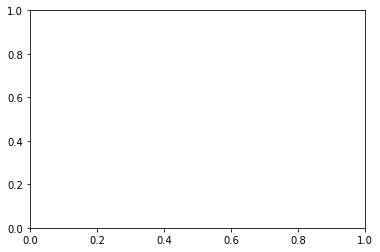

In [8]:
plt.clf()
plt.scatter(features_TSNE[:, 0], features_TSNE[:, 1], 
            # c=all_data_labels[:,0]*255, 
            c=all_data_labels*255, 
            cmap="viridis")
plt.clim(-0.5, 9.5)
figure = plt.gcf()  # get current figure
figure.set_size_inches(35, 35)
plt.show()

In [ ]:
# np.save("tsne", features_TSNE)
features_TSNE[0:10]

In [ ]:
# %autoreload
# all_data_imgs = (all_data_imgs + 0.5) * 255
# cv2.imwrite("tsne_test.png", img)
all_data_imgs_rgb = all_data_imgs.copy()
for i in range(len(all_data_imgs)):
    if pred_labels_all_data[:,0][i] > 0.5:
        img = img_heatmap(all_data_imgs[i], color=0.5)
    else:
        img = all_data_imgs[i]
        img = (img + 0.5) * 255
        img = cv2.cvtColor(img.astype(np.float32), cv2.COLOR_BGR2RGB)
    all_data_imgs_rgb[i] = img
    if i % 1000 == 0:
        print str(i) + "/" + str(len(all_data_imgs))
    
plt.imshow(all_data_imgs_rgb[50].astype(np.uint8))

In [ ]:
# create a border around images for labelling in scatter plot
from matplotlib import cm

all_data_imgs_rgb_borders = all_data_imgs_rgb.copy()
for i, image in enumerate(all_data_imgs_rgb):
    image = min_resize(image, 64 - 5 * 2)
    image = cv2.copyMakeBorder(image, 1, 1, 1, 1, cv2.BORDER_CONSTANT, value=(255,255,255))

    b = 5 - 1
    color = None
    color_pred = None
    if all_data_labels[:,0][i] == 1:
        color = np.array(cm.viridis(255)[0:3]) * 255
    else:
        color = np.array(cm.viridis(0)[0:3]) * 255
    
    if pred_labels_all_data[:,0][i] > 0.5:
        color_pred = np.array(cm.viridis(255)[0:3]) * 255
    else:
        color_pred = np.array(cm.viridis(0)[0:3]) * 255
    print color
    all_data_imgs_rgb_borders[i] = cv2.copyMakeBorder(image, b, b, b, b, 
                                                      cv2.BORDER_CONSTANT, 
                                                      value=color) 
    if i < len(hists_train):
        all_data_imgs_rgb_borders[i] = cv2.rectangle(all_data_imgs_rgb_borders[i], 
                                              (7, 56), (14, 49), color_pred, 2, 4)
    else:
        all_data_imgs_rgb_borders[i] = cv2.rectangle(all_data_imgs_rgb_borders[i], 
                                              (6, 57), (15, 48), color_pred, -1)
    

all_data_imgs_rgb_borders = all_data_imgs_rgb_borders.astype(np.uint8)

In [ ]:
plt.imshow(all_data_imgs_rgb_borders[5])
print pred_labels_all_data[:,0][i]
# plt.imshow(all_data_imgs_rgb_borders[0])

In [ ]:
img = image_scatter(features_TSNE, all_data_imgs_rgb_borders, 
                    scatter_size=21000, 
                    img_size=64)
# plt.figure(figsize=(64,64)) 
# plt.imshow(img.astype(np.uint8))

In [ ]:
img2 = cv2.cvtColor(img.astype(np.float32), 
                        cv2.COLOR_BGR2RGB)
cv2.imwrite("tsne_test6.png", img2.astype(np.uint8))

---
# Running ensemble

In [64]:
ensemble = ["./ensemble_models/ensemble_1_best_ep_839.ckpt", 
            "./ensemble_models/ensemble_2_best_ep_801.ckpt", 
            "./ensemble_models/ensemble_3_best_ep_856.ckpt",
            "./ensemble_models/ensemble_4_best_ep_818.ckpt",
            "./ensemble_models/ensemble_5_best_ep_810.ckpt"]

In [65]:
for kfold, model_name in enumerate(ensemble): 
    hists_test = np.load("hists_test_kfold_"+str(kfold)+".npy")
    labels_test = np.load("labels_test_kfold_"+str(kfold)+".npy")
    
    saver = tf.train.Saver()
    saver.restore(sess, model_name)
    
    batch_size = 1000
    number_of_runs = np.ceil(len(hists_test) / batch_size) + 1
    test_accuracies = []
    pred_labels = np.empty([0,2])
    start = 0.

    for i in range(number_of_runs.astype(int)):
        batch_begin = int(i*batch_size)
        batch_end = int(np.min((i*batch_size+batch_size, len(hists_test))))

        batch_X = hists_test[batch_begin:batch_end]
        batch_Y = labels_test[batch_begin:batch_end]
        test_dict = {X: batch_X, Y_: batch_Y, keep_prob: 1.0, \
                    tst: True, iter: start+i, tst_conv: True}
        
        test_pred, test_accuracy = sess.run([Y, accuracy], feed_dict=test_dict)
        pred_labels = np.concatenate((pred_labels, test_pred))

    pred_pos = (np.argmax(pred_labels, axis=1)==0)
    pred_neg = (np.argmax(pred_labels, axis=1)==1)

    truth_pos = (np.argmax(labels_test, axis=1)==0)
    truth_neg = (np.argmax(labels_test, axis=1)==1)

    true_pos = np.intersect1d(np.where(pred_pos), np.where(truth_pos))
    true_neg = np.intersect1d(np.where(pred_neg), np.where(truth_neg))
    false_pos = np.intersect1d(np.where(pred_pos), np.where(truth_neg))
    false_neg = np.intersect1d(np.where(pred_neg), np.where(truth_pos))

    sens = len(true_pos) / float(len(true_pos) + len(false_neg) + 0.00001)
    spec = len(true_neg) / float(len(true_neg) + len(false_pos) + 0.00001)
    ppv = len(true_pos) / float(len(true_pos) + len(false_pos) + 0.00001)
    npv = len(true_neg) / float(len(true_neg) + len(false_neg) + 0.00001)

    acc = (len(true_pos) + len(true_neg)) / float(len(labels_test) + 0.00001)
    
    print "Number of false pos: " + str(len(false_pos))
    print "Number of false neg: " + str(len(false_neg))

    print "Test sensitivity: " + str(sens)
    print "Test specifitity: " + str(spec)
    print "Test positive predictive value: " + str(ppv)
    print "Test accuracy: " + str(acc)
    
    print ""
    print "-------------------"
    print ""

INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_1_best_ep_839.ckpt
Number of false pos: 81
Number of false neg: 427
Test sensitivity: 0.785534903136
Test specifitity: 0.974711205199
Test positive predictive value: 0.95075987264
Test accuracy: 0.902194838463

-------------------

INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_2_best_ep_801.ckpt
Number of false pos: 104
Number of false neg: 341
Test sensitivity: 0.803231386017
Test specifitity: 0.973209683222
Test positive predictive value: 0.930481277203
Test accuracy: 0.920747994798

-------------------

INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_3_best_ep_856.ckpt
Number of false pos: 117
Number of false neg: 346
Test sensitivity: 0.788508552637
Test specifitity: 0.968791675197
Test positive predictive value: 0.916844343164
Test accuracy: 0.914020425415

-------------------

INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_4_best_ep_818.ckpt
Numbe

---
# Run on real test set!

In [66]:
sys.path.append('../3_svm_model/')
sys.path.append('../2_compare_detectors/')

from train import filenames_for_participants

participants = []
for root, dirnames, filenames in os.walk("../../images/test_set"):
        for filename in fnmatch.filter(filenames, '*.png'):
            part = filename.split(" - ")[0]
            if part not in participants:
                participants.append(part)

participants.sort()
    
filenames_pos, filenames_neg = \
    filenames_for_participants(participants,
        os.walk("../../images/test_set"), cream=True)

filenames_pos.sort()
filenames_neg.sort()

test_set_pos = []
test_set_neg = []

for i, filename in enumerate(filenames_pos):
    img = cv2.imread(filename)
    img = cv2.resize(img, (64, 64))
    test_set_pos.append(img)
for i, filename in enumerate(filenames_neg):
    img = cv2.imread(filename)
    img = cv2.resize(img, (64, 64))
    test_set_neg.append(img)

In [67]:
labels_test = np.zeros(len(test_set_pos)+len(test_set_neg))
labels_test[len(test_set_pos):] = 1
labels_test = (labels_test[:,None] == np.arange(2)).astype(float)

hists_test = np.concatenate((test_set_pos, test_set_neg))
hists_test = hists_test / 255.0 - 0.5

In [68]:
print len(labels_test)

3315


In [70]:
predictions = []
for kfold, model_name in enumerate(ensemble): 
    saver = tf.train.Saver()
    saver.restore(sess, model_name)
    
    batch_size = 1000
    number_of_runs = np.ceil(len(hists_test) / batch_size) + 1
    test_accuracies = []
    pred_labels = np.empty([0,2])
    start = 0.

    for i in range(number_of_runs.astype(int)):
        batch_begin = int(i*batch_size)
        batch_end = int(np.min((i*batch_size+batch_size, len(hists_test))))

        batch_X = hists_test[batch_begin:batch_end]
        batch_Y = labels_test[batch_begin:batch_end]
        test_dict = {X: batch_X, Y_: batch_Y, keep_prob: 1.0, \
                    tst: True, iter: start+i, tst_conv: True}
        
        test_pred, test_accuracy = sess.run([Y, accuracy], feed_dict=test_dict)
        pred_labels = np.concatenate((pred_labels, test_pred))
    
    predictions.append(pred_labels)

INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_1_best_ep_839.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_2_best_ep_801.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_3_best_ep_856.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_4_best_ep_818.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_5_best_ep_810.ckpt


Now calculate the average prediction of the ensemble

In [71]:
preds = np.array(predictions)
mean_preds = np.mean(preds, axis=0)
mean_preds[0:10]

array([[  3.81339219e-10,   1.00000000e+00],
       [  2.76563834e-02,   9.72343636e-01],
       [  9.99999309e-01,   6.76461005e-07],
       [  1.15082208e-03,   9.98849189e-01],
       [  1.21493704e-14,   1.00000000e+00],
       [  6.32201434e-21,   1.00000000e+00],
       [  4.06650874e-18,   1.00000000e+00],
       [  9.99998116e-01,   1.90497380e-06],
       [  9.38621013e-11,   1.00000000e+00],
       [  9.99921346e-01,   7.86456573e-05]])

In [72]:
pred_pos = (np.argmax(mean_preds, axis=1)==0)
pred_neg = (np.argmax(mean_preds, axis=1)==1)

truth_pos = (np.argmax(labels_test, axis=1)==0)
truth_neg = (np.argmax(labels_test, axis=1)==1)

true_pos = np.intersect1d(np.where(pred_pos), np.where(truth_pos))
true_neg = np.intersect1d(np.where(pred_neg), np.where(truth_neg))
false_pos = np.intersect1d(np.where(pred_pos), np.where(truth_neg))
false_neg = np.intersect1d(np.where(pred_neg), np.where(truth_pos))

sens = len(true_pos) / float(len(true_pos) + len(false_neg))
spec = len(true_neg) / float(len(true_neg) + len(false_pos))
ppv = len(true_pos) / float(len(true_pos) + len(false_pos))
npv = len(true_neg) / float(len(true_neg) + len(false_neg))

acc = (len(true_pos) + len(true_neg)) / float(len(labels_test))

print "Number of false pos: " + str(len(false_pos))
print "Number of false neg: " + str(len(false_neg))
print "Number of true pos: " + str(len(true_pos))
print "Number of true neg: " + str(len(true_neg))

print "Test sensitivity: " + str(sens)
print "Test specifitity: " + str(spec)
print "Test positive predictive value: " + str(ppv)
print "Test accuracy: " + str(acc)

Number of false pos: 20
Number of false neg: 295
Number of true pos: 497
Number of true neg: 2503
Test sensitivity: 0.627525252525
Test specifitity: 0.992072929053
Test positive predictive value: 0.961315280464
Test accuracy: 0.904977375566


**False positives and negatives**

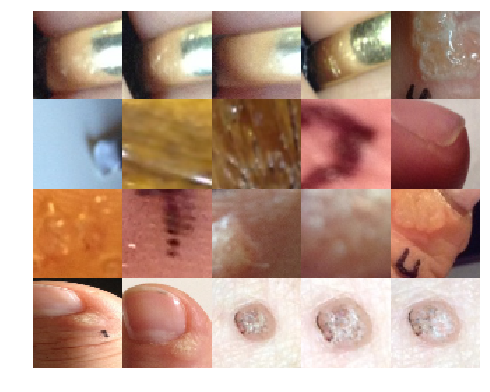

In [75]:
fig = plt.figure(figsize=(8, 8)) 
tstimages = (hists_test[false_pos] + 0.5) * 255.0
for i in range(len(false_pos)):
    tstimages[i] = cv2.cvtColor(tstimages[i].astype(np.float32), cv2.COLOR_BGR2RGB)
plt.axis('off')
plt.imshow(ia.draw_grid(tstimages, cols=5, rows=4))

In [ ]:
fig = plt.figure(figsize=(64, 64)) 
tstimages = (hists_test[false_neg] + 0.5) * 255.0
for i in range(len(false_neg)):
    tstimages[i] = cv2.cvtColor(tstimages[i].astype(np.float32), cv2.COLOR_BGR2RGB)
plt.imshow(ia.draw_grid(tstimages, cols=4, rows=30))

---
# Run on whole images

In [76]:
# make a pyramid of images
# these functions are inspired by 
# http://www.pyimagesearch.com/2015/03/23/sliding-windows-for-object-
# detection-with-python-and-opencv/
def pyramid(image, scale=0.75, min_size=(30, 30)):
    yield image
    while True:
        image = cv2.resize(image, (0, 0), fx=scale, fy=scale)
        if image.shape[0] >= min_size[0] and image.shape[1] >= min_size[1]:
            yield image
        else:
            break


def sliding_window(image, step_size, window_size):
    for y in xrange(0, image.shape[0], step_size):
        for x in xrange(0, image.shape[1], step_size):
            yield (x, y, image[y:y + window_size[1], x:x + window_size[0]])


def image_windows(image_filename, window_size=(64, 64), 
                  min_size=(256,256), step_size=32, pyr_scale=0.75):

    image = cv2.imread(image_filename)
    overall_start_time = time.time()
    images = []
    windows = []
    for (i, resized) in enumerate(pyramid(image, min_size=min_size, scale=pyr_scale)):
        newdetections = []
        n = 0
        for (x, y, window) in sliding_window(resized, step_size=32, window_size=window_size):
            if window.shape[0] != window_size[0] or window.shape[1] != window_size[1]:
                continue

            images.append(window)

            windows.append([x / (pyr_scale ** i), y / (pyr_scale ** i), 
                            window_size[0] / (pyr_scale ** i), 
                            window_size[1] / (pyr_scale ** i)])

    return (windows, images)

def image_windows_with_edges(image_filename, size=(64, 64), 
                             min_size=(64, 64), step_size=32, pyr_scale=0.5):
    
    image = cv2.imread(image_filename)
    overall_start_time = time.time()
    images = []
    windows = []
    
    for (i, resized) in enumerate(pyramid(image, min_size=min_size, scale=pyr_scale)):
        steps = np.ceil((resized.shape[0] + size[0]) / float(step_size)).astype(int) + 1
        print i
        for y in range(steps):        
            for x in range(steps):
                blocked_image = np.zeros([size[0], size[1], 3]) 
                if step_size*y <= 0 or step_size*x <= 0 or \
                    step_size*y-size[0] >= resized.shape[0] or \
                    step_size*x-size[1] >= resized.shape[1]: 
                    continue
                                
                max_y = np.max((0,step_size*y-size[0]))
                max_x = np.max((0,step_size*x-size[1]))
                
                img_part = resized[max_y:step_size*y, max_x:step_size*x]
                blocked_image[0:img_part.shape[0], 0:img_part.shape[1]] = img_part
                
                windows.append([max_x / (pyr_scale ** i), max_y / (pyr_scale ** i), 
                                img_part.shape[1] / (pyr_scale ** i), 
                                img_part.shape[0] / (pyr_scale ** i)])
                
                images.append(blocked_image)
    return (windows, images)

def make_heatmap_full_img(predictions, windows, size):
    heatmap = np.zeros(size)
    for i, prediction in enumerate(predictions):
        x = windows[i][0]
        y = windows[i][1]
        w = windows[i][2]
        h = windows[i][3]
        if prediction > 0.5:
            heatmap[int(y):int(y + h), int(x):int(x + w)] += prediction

    return heatmap

In [77]:
names = []
for root, dirnames, filenames in os.walk("../../images/train_set"):
    for filename in fnmatch.filter(filenames, '*.png'):
        names.append(filename)

all_filenames = []
for root, dirnames, filenames in os.walk("../../results/naive_algorithm_per_img"):
    for filename in fnmatch.filter(filenames, '*.png'):
        if root not in all_filenames:
            all_filenames.append(root)

original_names = []
for i in range(len(names)):
    file = names[i]
    foldername = file[:-12].strip() + ".png"
    original = None
    original = filter(lambda x: foldername in x, all_filenames)
    for loc in original:
        original_names.append(loc + "/original.png")
        
original_names[0:10]

['../../results/naive_algorithm_per_img/user_005/date_1425645890/005 - 2015-03-06 - 1.png/original.png',
 '../../results/naive_algorithm_per_img/user_055/date_1426418235/055 - 2015-03-15 - 7.png/original.png',
 '../../results/naive_algorithm_per_img/user_79/date_1424092942/79 - 2015-02-16 - 8.png/original.png',
 '../../results/naive_algorithm_per_img/user_031/date_1428441683/031 - 2015-04-07 - 1.png/original.png',
 '../../results/naive_algorithm_per_img/user_005/date_1426239503/005 - 2015-03-13 - 2.png/original.png',
 '../../results/naive_algorithm_per_img/user_038/date_1432669860/038 - 2015-05-26 - 1.png/original.png',
 '../../results/naive_algorithm_per_img/user_038/date_1432669860/038 - 2015-05-26 - 1.png/original.png',
 '../../results/naive_algorithm_per_img/user_047/date_1430984444/047 - 2015-05-07 - 6.png/original.png',
 '../../results/naive_algorithm_per_img/user_034/date_1425752944/034 - 2015-03-07 - 7.png/original.png',
 '../../results/naive_algorithm_per_img/user_063/date_142

(512, 512, 3)


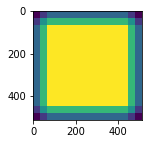

In [82]:
img = original_names[0]
print cv2.imread(img).shape
windows, images = image_windows(img, pyr_scale=0.5)
fig = plt.figure(figsize=(2, 2)) 
for i in range(len(images)):
    images[i] = cv2.cvtColor(images[i].astype(np.float32), cv2.COLOR_BGR2RGB)
plt.imshow(ia.draw_grid(images, cols=3, rows=3))
hm = make_heatmap_full_img(np.ones(len(windows)), windows, (512, 512))
plt.imshow(hm)

In [83]:
ensemble = ["./ensemble_models/ensemble_1_best_ep_839.ckpt", 
            "./ensemble_models/ensemble_2_best_ep_801.ckpt", 
            "./ensemble_models/ensemble_3_best_ep_856.ckpt",
            "./ensemble_models/ensemble_4_best_ep_818.ckpt",
            "./ensemble_models/ensemble_5_best_ep_810.ckpt"]

def preds_from_ensemble(ensemble, images):
    predictions = []
    for kfold, model_name in enumerate(ensemble): 
        saver = tf.train.Saver()
        saver.restore(sess, model_name)
        test_dict = {X: images, keep_prob: 1.0, \
                    tst: True, iter: 0, tst_conv: True}
        test_pred = sess.run([Y], feed_dict=test_dict)
        
        predictions.append(test_pred)
        
    preds = np.array(predictions)
    mean_preds = np.mean(preds, axis=0)
    return mean_preds

def classify_img(ensemble, image_filename):
    windows, images = image_windows(image_filename, min_size=(64,64), pyr_scale=0.5)
    norm_imgs = np.array(images) / 255. - 0.5
    test_pred = preds_from_ensemble(ensemble, norm_imgs)
    hm = make_heatmap_full_img(test_pred[0][:,0], windows, (512, 512))
    max_val = np.max(hm)
    return (max_val > 3, max_val)

0
1
2
3
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_1_best_ep_839.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_2_best_ep_801.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_3_best_ep_856.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_4_best_ep_818.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_5_best_ep_810.ckpt
0
1
2
3
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_1_best_ep_839.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_2_best_ep_801.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_3_best_ep_856.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_4_best_ep_818.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_5_best_ep_810.ckpt
0
1
2
3
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_1_best_ep_839.ckpt
INFO:ten

/usr/local/lib/python2.7/dist-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


0
1
2
3
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_1_best_ep_839.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_2_best_ep_801.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_3_best_ep_856.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_4_best_ep_818.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_5_best_ep_810.ckpt
0
1
2
3
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_1_best_ep_839.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_2_best_ep_801.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_3_best_ep_856.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_4_best_ep_818.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_5_best_ep_810.ckpt
0
1
2
3
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_1_best_ep_839.ckpt
INFO:ten

INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_3_best_ep_856.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_4_best_ep_818.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_5_best_ep_810.ckpt
0
1
2
3
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_1_best_ep_839.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_2_best_ep_801.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_3_best_ep_856.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_4_best_ep_818.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_5_best_ep_810.ckpt
0
1
2
3
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_1_best_ep_839.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_2_best_ep_801.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_3_best_ep_856.ckpt
INFO:tensorflow:

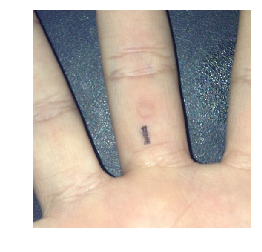

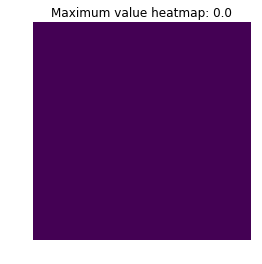

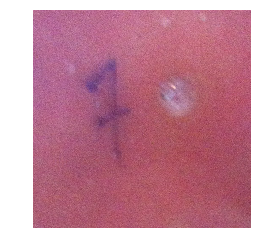

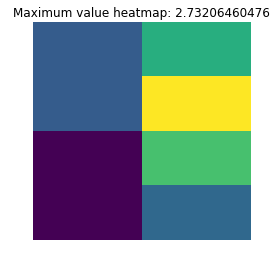

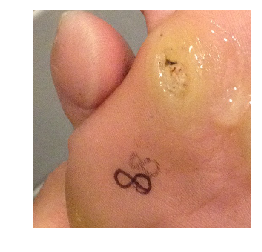

...

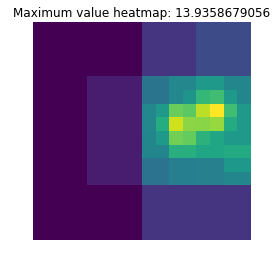

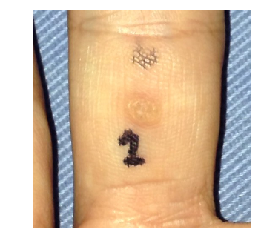

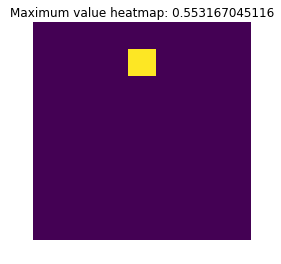

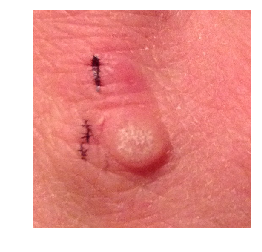

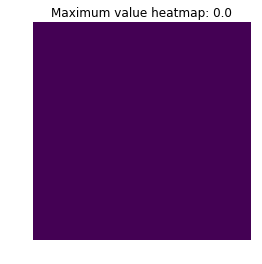

In [93]:
for i in range(40):
    img = original_names[i]
    windows, images = image_windows(img, min_size=(64,64), pyr_scale=0.5)
    norm_imgs = np.array(images) / 255. - 0.5
    test_pred = preds_from_ensemble(ensemble, norm_imgs)

    img_ = cv2.imread(img)
    hm = make_heatmap_full_img(test_pred[0][:,0], windows, (img_.shape[0] , img_.shape[1]))
    max_val = np.max(hm)
    img_ = cv2.cvtColor(img_.astype(np.float32), cv2.COLOR_BGR2RGB)
    plt.figure()
    plt.axis('off')
    plt.imshow(img_.astype(np.uint8))
    plt.figure()
    plt.axis('off')
    plt.title("Maximum value heatmap: " + str(max_val))
    plt.imshow(hm)

In [17]:
print img_.shape

(512, 512, 3)


INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_1_best_ep_839.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_2_best_ep_801.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_3_best_ep_856.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_4_best_ep_818.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_5_best_ep_810.ckpt


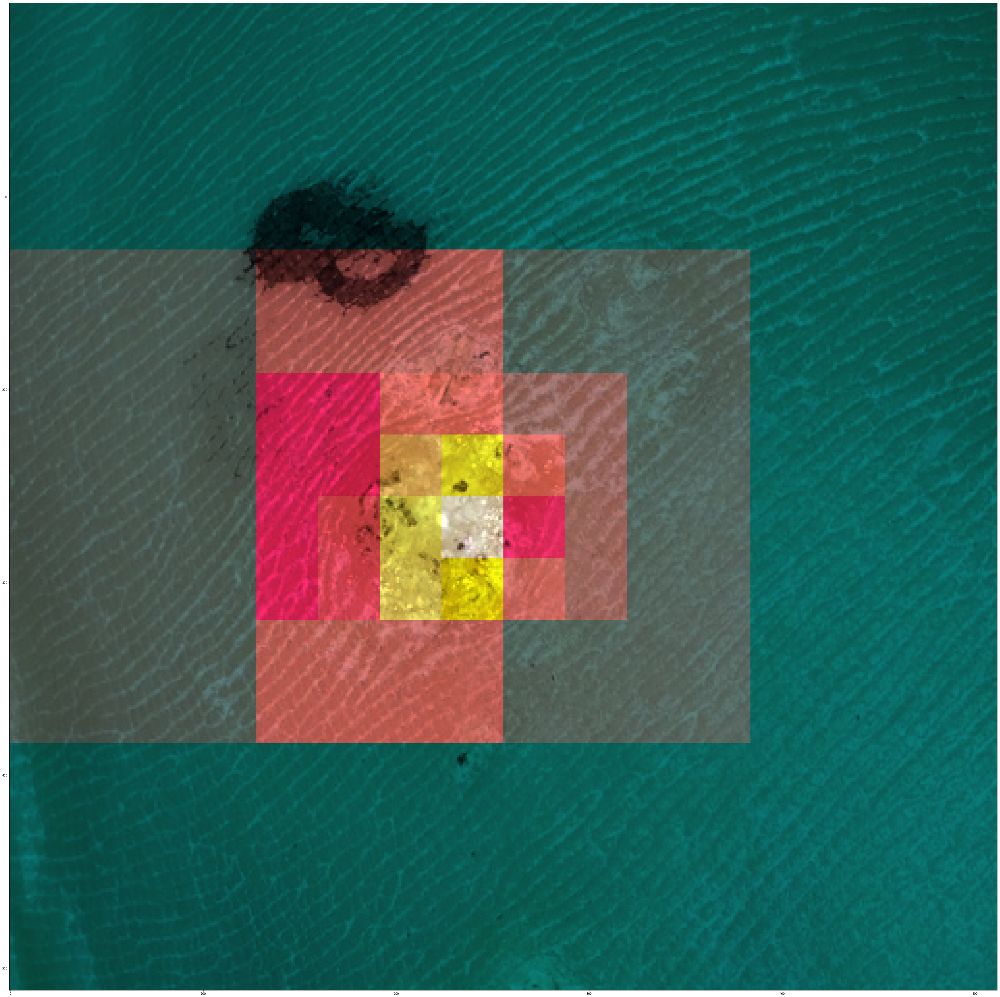

In [125]:
img = "./../7_humanvsmodel/images/14.png"
windows, images = image_windows(img, min_size=(64,64), pyr_scale=0.5)
norm_imgs = np.array(images) / 255. - 0.5
test_pred = preds_from_ensemble(ensemble, norm_imgs)

img_ = cv2.imread(img)
hm = make_heatmap_full_img(test_pred[0][:,0], windows, (img_.shape[0] , img_.shape[1]))
max_val = np.max(hm)
img_ = cv2.cvtColor(img_.astype(np.float32), cv2.COLOR_BGR2RGB)
fig = plt.figure(figsize=(64, 64)) 

cmap = plt.get_cmap('hot')
heatmap_color = cmap(hm/np.max(hm))
heatmap_color = np.delete(heatmap_color, 3, 2)
heatmap_color[np.where(heatmap_color==0)] = 0.5

plt.imshow((img_ * heatmap_color).astype(np.uint8))


In [15]:
indices = [2, 5, 7, 17, 20, 26, 29, 31, 33, 39, 42, 45, 47, 48, 9, 16, 22, 46, \
           11, 23, 27, 38, 49, 34, 6, 18, 3, 44, 1, 25, 50, 14, 8, 19, 21, 32, \
           37, 40, 41, 4, 10, 12, 13, 15, 24, 28, 30, 35, 36, 43]

preds = []
for i in indices:
    filename = "../7_humanvsmodel/images/" + str(i) + ".png"
    print 
    pos, maxv = classify_img(ensemble, filename)
    if pos:
        preds.append(1)
    else:
        preds.append(0)
    print filename + ": " + str(maxv)
print preds


INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_1_best_ep_839.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_2_best_ep_801.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_3_best_ep_856.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_4_best_ep_818.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_5_best_ep_810.ckpt
../7_humanvsmodel/images/2.png: 8.50505489111

INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_1_best_ep_839.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_2_best_ep_801.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_3_best_ep_856.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_4_best_ep_818.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_5_best_ep_810.ckpt
../7_humanvsmodel/images/5.png: 11.9973848462

INFO:tensorflow:Restoring

../7_humanvsmodel/images/22.png: 2.44814395905

INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_1_best_ep_839.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_2_best_ep_801.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_3_best_ep_856.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_4_best_ep_818.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_5_best_ep_810.ckpt
../7_humanvsmodel/images/46.png: 0.632039427757

INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_1_best_ep_839.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_2_best_ep_801.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_3_best_ep_856.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_4_best_ep_818.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_5_best_ep_810.ckpt
../7_humanvsmodel/image

../7_humanvsmodel/images/19.png: 0.0

INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_1_best_ep_839.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_2_best_ep_801.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_3_best_ep_856.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_4_best_ep_818.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_5_best_ep_810.ckpt
../7_humanvsmodel/images/21.png: 0.586367249489

INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_1_best_ep_839.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_2_best_ep_801.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_3_best_ep_856.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_4_best_ep_818.ckpt
INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_5_best_ep_810.ckpt
../7_humanvsmodel/images/32.png: 

---
# Generate table

In [149]:
all_filenames = []
for root, dirnames, filenames in os.walk("../../results/naive_algorithm_per_img"):
    for filename in fnmatch.filter(filenames, 'original.png'):
        if root not in all_filenames:
            all_filenames.append(root + "/" + filename)

print len(all_filenames)


8676


In [140]:
def preds_from_model(images):
    predictions = []
    test_dict = {X: images, keep_prob: 1.0, \
                tst: True, iter: 0, tst_conv: True}
    test_pred = sess.run([Y], feed_dict=test_dict)

    predictions.append(test_pred)
    preds = np.array(predictions)
    return preds

def eff_classify_img(image_filename):
    windows, images = image_windows(image_filename, min_size=(64,64), pyr_scale=0.5)
    norm_imgs = np.array(images) / 255. - 0.5
    test_pred = preds_from_model(norm_imgs)
    hm = make_heatmap_full_img(test_pred[0][0][:,0], windows, (512, 512))
    max_val = np.max(hm)
    return (max_val > 3, max_val)

In [151]:
ensemble = ["./ensemble_models/ensemble_1_best_ep_839.ckpt", 
            "./ensemble_models/ensemble_2_best_ep_801.ckpt", 
            "./ensemble_models/ensemble_3_best_ep_856.ckpt",
            "./ensemble_models/ensemble_4_best_ep_818.ckpt",
            "./ensemble_models/ensemble_5_best_ep_810.ckpt"]

invalid_counter = 0

for i in range(5):
    saver = tf.train.Saver()
    saver.restore(sess, ensemble[i])

    for iden, img_filename in enumerate(all_filenames):
        if iden % 100 == 0:
            print str((iden/float(len(all_filenames) * (i+1))) / 5. * 100.) + "% done."

        image = cv2.imread(img_filename)
        
        if image is None:
            invalid_counter += 1
            compliant = False
            max_val = 0.
        else:
            compliant, max_val = eff_classify_img(img_filename)
            
        target = open("./results_all/img_" + str(iden) + "_" + str(i) + ".txt", 'w')
        target.write(str(max_val) + "\n")
        if compliant:
            target.write("compliant")
        else:
            target.write("non-compliant")
        target.close()

print str(invalid_counter) + " images not found"

INFO:tensorflow:Restoring parameters from ./ensemble_models/ensemble_1_best_ep_839.ckpt
0.0% done.
0.230520977409% done.
0.461041954818% done.
0.691562932227% done.
0.922083909636% done.
1.15260488704% done.
1.38312586445% done.
1.61364684186% done.
1.84416781927% done.
2.07468879668% done.
2.30520977409% done.
2.5357307515% done.
2.76625172891% done.
2.99677270632% done.
3.22729368373% done.
3.45781466113% done.
3.68833563854% done.
3.91885661595% done.
4.14937759336% done.
4.37989857077% done.
4.61041954818% done.
4.84094052559% done.
5.071461503% done.
5.30198248041% done.
5.53250345781% done.
5.76302443522% done.
5.99354541263% done.
6.22406639004% done.
6.45458736745% done.
6.68510834486% done.
6.91562932227% done.
7.14615029968% done.
7.37667127709% done.
7.6071922545% done.
7.8377132319% done.
8.06823420931% done.
8.29875518672% done.
8.52927616413% done.
8.75979714154% done.
8.99031811895% done.
9.22083909636% done.
9.45136007377% done.
9.68188105118% done.
9.91240202858% done.

1.06039649608% done.
1.10650069156% done.
1.15260488704% done.
1.19870908253% done.
1.24481327801% done.
1.29091747349% done.
1.33702166897% done.
1.38312586445% done.
1.42923005994% done.
1.47533425542% done.
1.5214384509% done.
1.56754264638% done.
1.61364684186% done.
1.65975103734% done.
1.70585523283% done.
1.75195942831% done.
1.79806362379% done.
1.84416781927% done.
1.89027201475% done.
1.93637621024% done.
1.98248040572% done.
2.0285846012% done.
2.07468879668% done.
2.12079299216% done.
2.16689718764% done.
2.21300138313% done.
2.25910557861% done.
2.30520977409% done.
2.35131396957% done.
2.39741816505% done.
2.44352236053% done.
2.48962655602% done.
2.5357307515% done.
2.58183494698% done.
2.62793914246% done.
2.67404333794% done.
2.72014753343% done.
2.76625172891% done.
2.81235592439% done.
2.85846011987% done.
2.90456431535% done.
2.95066851083% done.
2.99677270632% done.
3.0428769018% done.
3.08898109728% done.
3.13508529276% done.
3.18118948824% done.
3.22729368373% do